## COVID Tissue Atlas: Data processing for a single organ
Covid Tissue Atlas, CZ Biohub <br>
Author: Ann Chen, Alejandro Granados <br>github: atchen, agranado<br>
Date: Sep 1st 2021 <br>
Organ: Prostate

We applied CellBender with FDR 0.01 to the raw counts for decontamination. This notebook applies quality control, batch correction and annotation of cell types for a specific organ of the COVID Tissue Atlas. 

- Read in Cellbender output (.h5ad) for each sample and combine into single adata object
- Perform quality control and filtering
- Perform batch correction (SCVI) and save UMAP on batch-corrected latent space
- Save processed object for downstream analysis

In [1]:
# sample name for adata object
sample = 'prostate'

In [2]:
pwd

'/mnt/ibm_lg/covid_tissue_atlas/notebooks'

### Import packages, initialize data directory, and set plot parameters

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc
import os
import scvi
import sys

#add path where utils.py will be called
sys.path.append('/mnt/ibm_lg/covid_tissue_atlas/CovidTissueAtlas/cta_utils/')
import utils

In [4]:
# directory final object and figures will be saved to
data_directory = '/mnt/ibm_lg/covid_tissue_atlas/data/tissue_objects/' + sample + '/'
figure_directory = '/mnt/ibm_lg/covid_tissue_atlas/data/tissue_figures/tissue_processing_figures/' + sample + '/'

# if directory doesn't exist, make directory
if not os.path.exists(data_directory):
    os.makedirs(data_directory)
    
if not os.path.exists(figure_directory):
    os.makedirs(figure_directory)

#print package versions
print('package versions:')
print('\n'.join(f'{m.__name__} {m.__version__}' for m in globals().values() if getattr(m, '__version__', None)))

# make sure you use these two parameters before saving figures to pdf
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

sc.settings.verbosity = 3            
sc.set_figure_params(dpi=150)
sc.settings.figdir = figure_directory

package versions:
numpy 1.21.0
pandas 1.2.5
seaborn 0.11.1
scanpy 1.7.2
scvi 0.11.0


### Read in h5ad objects to be combined into a single adata object

* takes in data path with decontaminated (cellbender) h5ad for each patient
* combines each patient h5ad object in the path into a single h5ad object (1 h5ad per tissue)
* skip if combined h5ad object for a single tissue already exists

Add directory for files to be read:

In [5]:
data_path = '/mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/' + sample + '/'

In [6]:
# ignore hidden files in directory (ignore files that begin with .)
data_folders = [f for f in os.listdir(data_path) if not f.startswith('.')]
display(data_folders)

['Cov19_1-5_prostate_cellbender.h5',
 'Cov19_527_prostate_cellbender.h5',
 'Cov19_12-29_prostate_cellbender.h5',
 'Cov19_12-22_prostate_cellbender.h5',
 'Cov19_12-14_prostate_cellbender.h5',
 'Cov19_1-6_prostate_cellbender.h5',
 'Cov19_12-1_prostate_cellbender.h5',
 'Control_FWH_prostate_cellbender.h5']

In [7]:
data_path

'/mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/prostate/'

In [8]:
adata = utils.read_cellbender_h5ad_to_combined_adata(data_path)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/prostate/Cov19_1-5_prostate_cellbender.h5


Cov19_1-5_prostate_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_1-5_prostate_cellbender.h5 size


(9151, 33567)

/data/achen/miniconda3/envs/atlas/lib/python3.9/site-packages/scipy/sparse/sputils.py:114: UserWarning: object dtype is not supported by sparse matrices
  warnings.warn("object dtype is not supported by sparse matrices")
reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/prostate/Cov19_527_prostate_cellbender.h5
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)


Cov19_527_prostate_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_527_prostate_cellbender.h5 size


(9406, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/prostate/Cov19_12-29_prostate_cellbender.h5


Cov19_12-29_prostate_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_12-29_prostate_cellbender.h5 size


(11172, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/prostate/Cov19_12-22_prostate_cellbender.h5


Cov19_12-22_prostate_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_12-22_prostate_cellbender.h5 size


(7676, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/prostate/Cov19_12-14_prostate_cellbender.h5


Cov19_12-14_prostate_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_12-14_prostate_cellbender.h5 size


(6550, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/prostate/Cov19_1-6_prostate_cellbender.h5


Cov19_1-6_prostate_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_1-6_prostate_cellbender.h5 size


(4567, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/prostate/Cov19_12-1_prostate_cellbender.h5


Cov19_12-1_prostate_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_12-1_prostate_cellbender.h5 size


(10649, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/prostate/Control_FWH_prostate_cellbender.h5
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Control_FWH_prostate_cellbender.h5
Control_FWH_prostate_cellbender.h5 size


(2070, 33567)

In [9]:
adata

AnnData object with n_obs × n_vars = 61241 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'

In [10]:
adata.obs.head()

,10X_run,disease_status,lab,tissue,Barcode,replicate,batch
1-5_AGCTCAAAGATGGTAT-1,1-5,Cov19,1-5,prostate,AGCTCAAAGATGGTAT-1,1,0
1-5_TACCCACCAGAGGAAA-1,1-5,Cov19,1-5,prostate,TACCCACCAGAGGAAA-1,1,0
1-5_TCGAAGTAGCTAAATG-1,1-5,Cov19,1-5,prostate,TCGAAGTAGCTAAATG-1,1,0
1-5_GATGTTGCAGACAAAT-1,1-5,Cov19,1-5,prostate,GATGTTGCAGACAAAT-1,1,0
1-5_GGCACGTAGCCTATTG-1,1-5,Cov19,1-5,prostate,GGCACGTAGCCTATTG-1,1,0


In [11]:
# convert replicate to string so adata can be saved
adata.obs['replicate'] = adata.obs['replicate'].astype(str)

In [12]:
#save unfiltered adata object with raw counts
adata.write(data_directory + sample + '_raw_unfiltered.h5ad')

... storing '10X_run' as categorical
... storing 'disease_status' as categorical
... storing 'lab' as categorical
... storing 'tissue' as categorical
... storing 'Barcode' as categorical
... storing 'replicate' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


In [13]:
#load unfiltered h5ad object with raw counts (if object already exists for tissue)
#adata = sc.read_h5ad(data_directory + sample + '_raw_unfiltered.h5ad')

In [14]:
adata

AnnData object with n_obs × n_vars = 61241 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'

### Pre-filtering QC metrics

In [15]:
adata.var.head()

,gene_ids,feature_types,genome
gene_symbol,,,
MIR1302-2HG,GRCh38premrna_ENSG00000243485,Gene Expression,GRCh38premrna
FAM138A,GRCh38premrna_ENSG00000237613,Gene Expression,GRCh38premrna
OR4F5,GRCh38premrna_ENSG00000186092,Gene Expression,GRCh38premrna
AL627309.1,GRCh38premrna_ENSG00000238009,Gene Expression,GRCh38premrna
AL627309.3,GRCh38premrna_ENSG00000239945,Gene Expression,GRCh38premrna


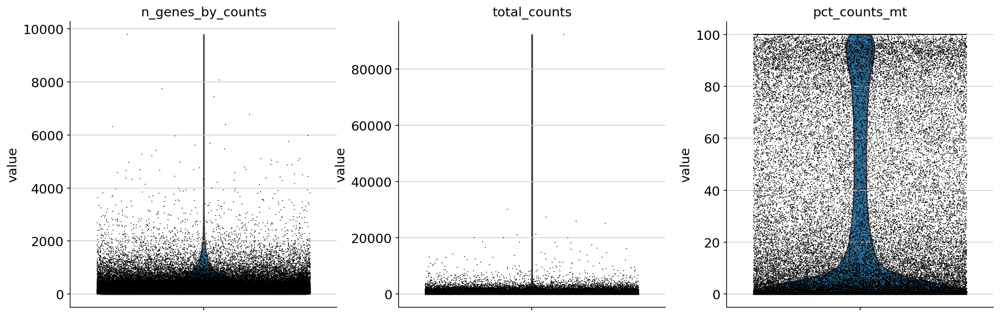

In [16]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

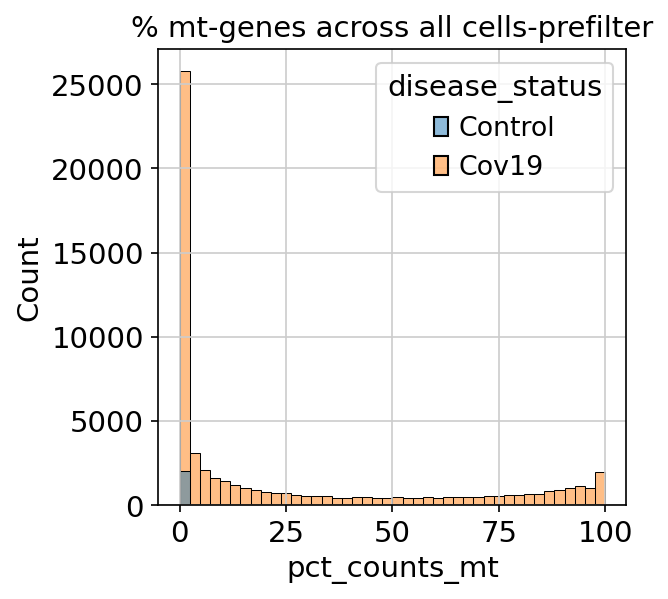

In [17]:
sns.histplot(data=adata.obs, x ='pct_counts_mt',hue='disease_status')
plt.title('% mt-genes across all cells-prefilter')
plt.savefig(figure_directory + sample + '_prefiltered_percent_mito-disease_status.pdf',bbox_inches = 'tight')

In [18]:
adata.obs['log_ncounts']  = np.log10(adata.obs.total_counts)
adata.obs['log_ngenes'] = np.log10(adata.obs['n_genes_by_counts'])

/data/achen/miniconda3/envs/atlas/lib/python3.9/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [19]:
# freeze counts in layer
adata.layers["counts"] = adata.X.copy()

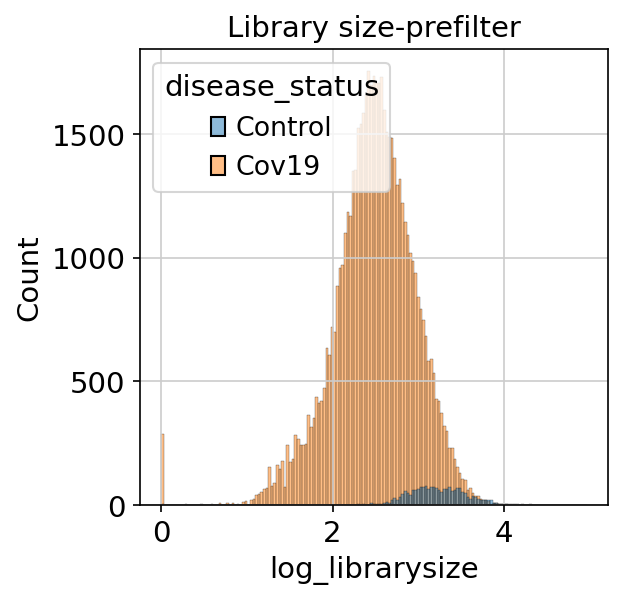

In [20]:
adata.obs['log_librarysize']  =np.log10(np.sum(adata.layers['counts'], axis =1) + 1)
sns.histplot(data=adata.obs, x='log_librarysize',hue='disease_status')
plt.title('Library size-prefilter')
plt.savefig(figure_directory + sample + '_prefiltered_library_size-disease_status.pdf',bbox_inches = 'tight')

### Filter by library size and mitochondrial gene percentage

utils.filter_adata(adata, min_n_counts, min_n_genes, filter, mt_cutoff, filter_max):
- adata: adata object to be filtered
- min_n_counts: remove cells < min_n_counts gene counts
- min_n_genes: remove cells < min_n_genes genes
- filter: filter type (normal, percent_mito, remove_all_mito_genes)
    - normal: no mt-filter
    - percent_mito: remove cells with % mt-genes > mt_cutoff
    - remove_all_mito_genes: remove all mito genes from adata.var 
-  filter out genes expressed in < 3 cells

In [21]:
#make a unfiltered copy
adata_unfiltered = adata.copy()

### Filter (remove cells <300 n_counts, <100 genes, and > 25% MT- genes)

In [22]:
adata = utils.filter_adata(adata_unfiltered, min_n_counts=300, min_n_genes=100, 
                           filter='percent_mito', mt_cutoff = 25, filter_max = 10000)
adata

filtered out 4334 genes that are detected in less than 3 cells
filtered out 33574 cells that have less than 300 counts
filtered out 56 cells that have more than 10000 counts
filtered out 22 cells that have less than 100 genes expressed


View of AnnData object with n_obs × n_vars = 24040 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log_ncounts', 'log_ngenes', 'log_librarysize'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'counts'

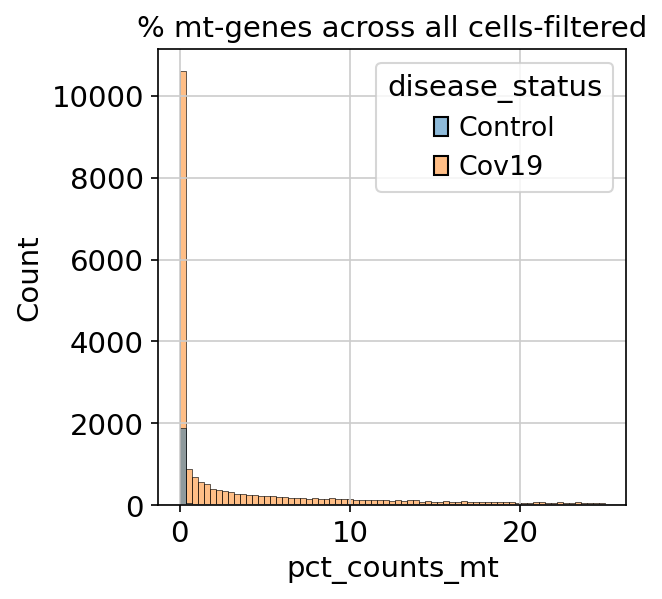

In [23]:
sns.histplot(data=adata.obs, x ='pct_counts_mt',hue='disease_status')
plt.title('% mt-genes across all cells-filtered')
plt.savefig(figure_directory + sample + '_filtered_percent_mito-disease_status.pdf',bbox_inches = 'tight')

Trying to set attribute `.obs` of view, copying.


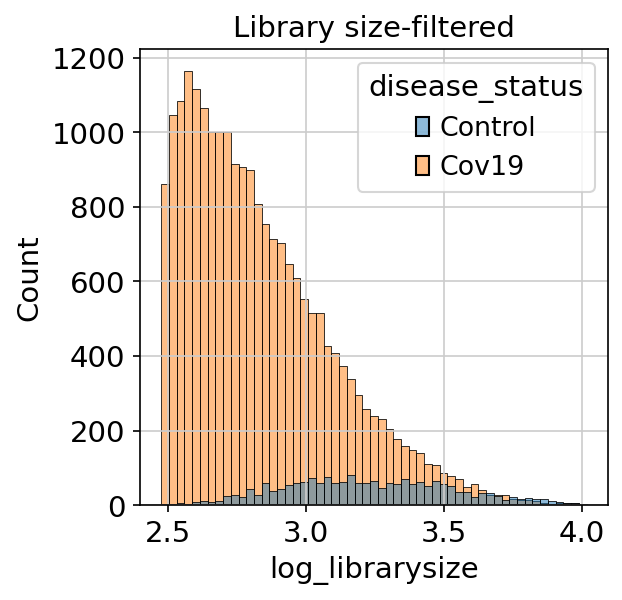

In [24]:
adata.obs['log_librarysize']  =np.log10(np.sum(adata.layers['counts'], axis =1))
sns.histplot(data=adata.obs, x='log_librarysize',hue='disease_status')
plt.title('Library size-filtered')
plt.savefig(figure_directory + sample + '_filtered_library_size-disease_status.pdf',bbox_inches = 'tight')

## Batch correction

### SCVI training and processing

- Save raw counts in a separate layer adata.layers['counts']
- Perform normalization with standard pipeline
- Prepare SCVI model 
- Train
- UMAP in new latent (batch-corrected) space
- Save SCVI-corrected object

In [25]:
adata = utils.run_scvi(adata, n_layers=2, n_latent=64)

normalizing counts per cell
    finished (0:00:00)


INFO     Using batches from adata.obs["10X_run"]                                             
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 24040 cells, 33567 vars, 8        
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 333/333: 100%|██████████| 333/333 [28:38<00:00,  5.16s/it, loss=2.56e+03, v_num=1]


In [26]:
adata = utils.compute_neighbors(adata, use_rep='X_scVI')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:24)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)


#### Save SCVI-corrected object

In [27]:
# save SCVI-corrected adata
adata.write(data_directory + sample + "_cellbender_scvi.h5ad")

#### Visualize SCVI-corrected UMAPs colored by patient source and disease status

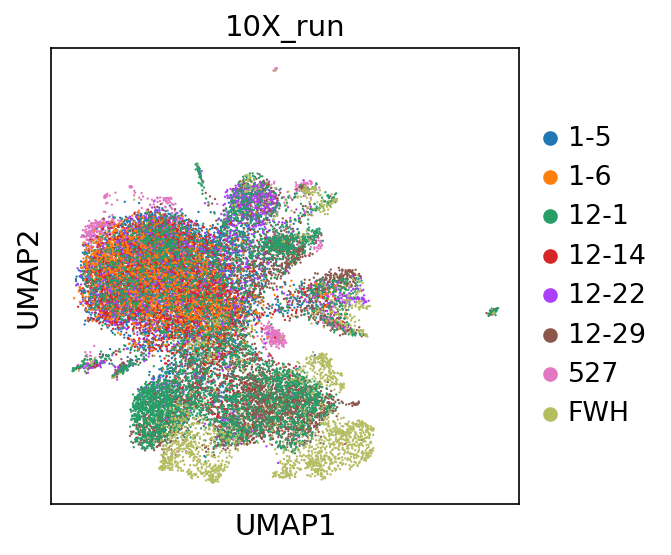

In [28]:
sc.pl.umap(adata, color='10X_run')

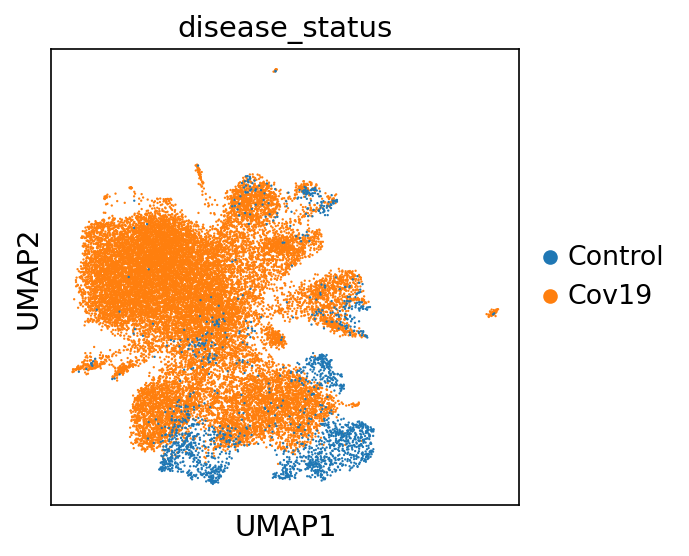

In [29]:
sc.pl.umap(adata, color='disease_status')

#### Check neuron contamination

We found strong contamination from neuronal genes in our samples. NRXN1, NRXN3, CNTNAP2, and RBFOX1 are good markers to identify contamination. We proceed to remove clusters with high expression of neuronal contamination and low expression of specific cell type markers

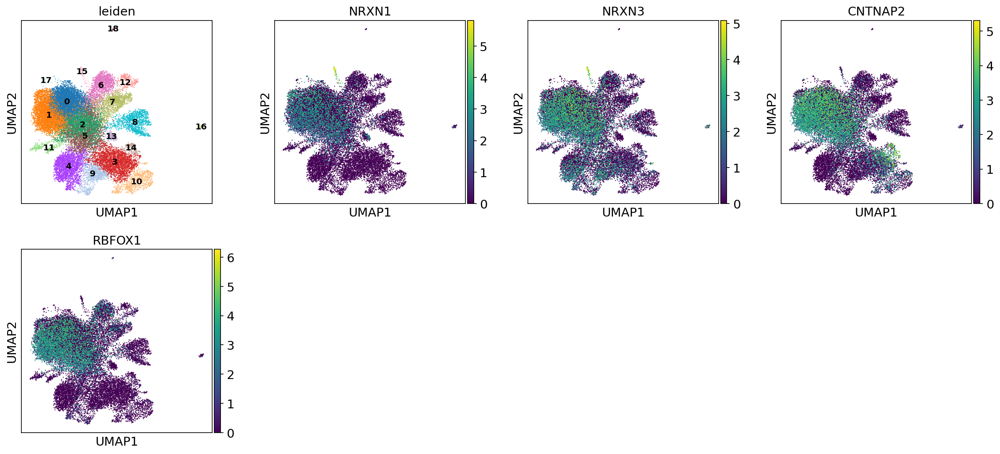

In [30]:
sc.pl.umap(adata, color=['leiden', 'NRXN1', 'NRXN3', 'CNTNAP2', 'RBFOX1'], legend_loc='on data', legend_fontsize='x-small')

#### Remove neuron-contaminated clusters

In [31]:
adata = adata[~adata.obs['leiden'].isin(['0', '1', '2']),:]

In [32]:
adata

View of AnnData object with n_obs × n_vars = 13755 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log_ncounts', 'log_ngenes', 'log_librarysize', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', '_scvi', 'neighbors', 'leiden', 'umap', '10X_run_colors', 'disease_status_colors', 'leiden_colors'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

### SCVI training and processing

In [33]:
adata = utils.run_scvi(adata, n_layers=2, n_latent=64)

/data/achen/miniconda3/envs/atlas/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell
    finished (0:00:00)


INFO     Using batches from adata.obs["10X_run"]                                             
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 13755 cells, 33567 vars, 8        
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [16:59<00:00,  2.55s/it, loss=2.57e+03, v_num=1]


In [34]:
adata = utils.compute_neighbors(adata, use_rep='X_scVI')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


#### Save SCVI-corrected object

In [35]:
# save SCVI-corrected adata
adata.write(data_directory + sample + "_cellbender_scvi.h5ad")

#### Check neuron contamination

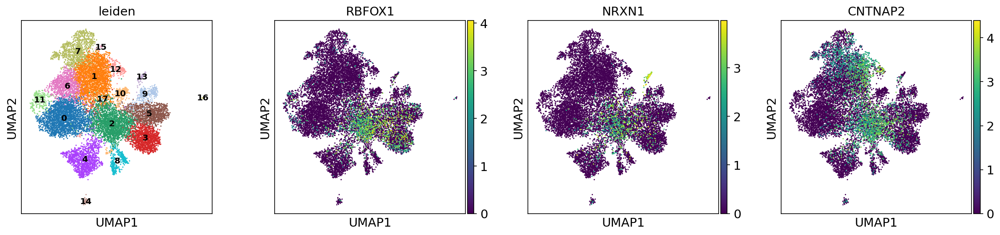

In [36]:
sc.pl.umap(adata, color=['leiden', 'RBFOX1', 'NRXN1', 'CNTNAP2'], legend_loc='on data', legend_fontsize='x-small')

#### Remove neuron-contaminated clusters

In [37]:
adata = adata[~adata.obs['leiden'].isin(['2']),:]

In [38]:
adata

View of AnnData object with n_obs × n_vars = 11746 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log_ncounts', 'log_ngenes', 'log_librarysize', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', '_scvi', 'neighbors', 'leiden', 'umap', '10X_run_colors', 'disease_status_colors', 'leiden_colors'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

### SCVI training and processing

In [39]:
adata = utils.run_scvi(adata, n_layers=2, n_latent=64)

/data/achen/miniconda3/envs/atlas/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell
    finished (0:00:00)


INFO     Using batches from adata.obs["10X_run"]                                             
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 11662 cells, 33567 vars, 7        
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [15:14<00:00,  2.29s/it, loss=2.56e+03, v_num=1]


In [40]:
adata = utils.compute_neighbors(adata, use_rep='X_scVI')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


#### Save SCVI-corrected object

In [41]:
# save SCVI-corrected adata
adata.write(data_directory + sample + "_cellbender_scvi.h5ad")

#### Check neuron contamination

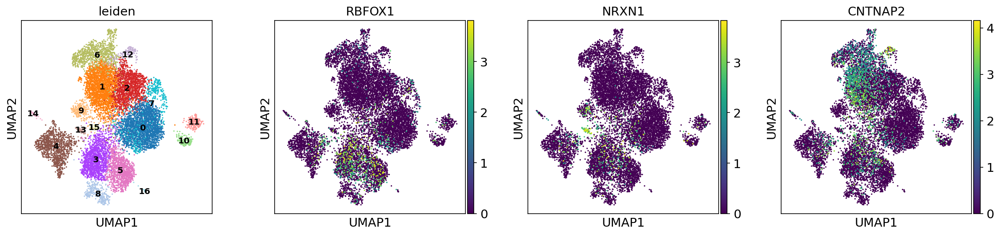

In [42]:
sc.pl.umap(adata, color=['leiden', 'RBFOX1', 'NRXN1', 'CNTNAP2'], legend_loc='on data', legend_fontsize='x-small')

## Remove doublets

In [43]:
sc.external.pp.scrublet(adata)

Running Scrublet
filtered out 8093 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
/data/achen/miniconda3/envs/atlas/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
    Scrublet finished (0:00:19)


Automatically set threshold at doublet score = 0.64
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 5.1%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 0.5%


(<Figure size 1200x450 with 2 Axes>,
 array([<AxesSubplot:title={'center':'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <AxesSubplot:title={'center':'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

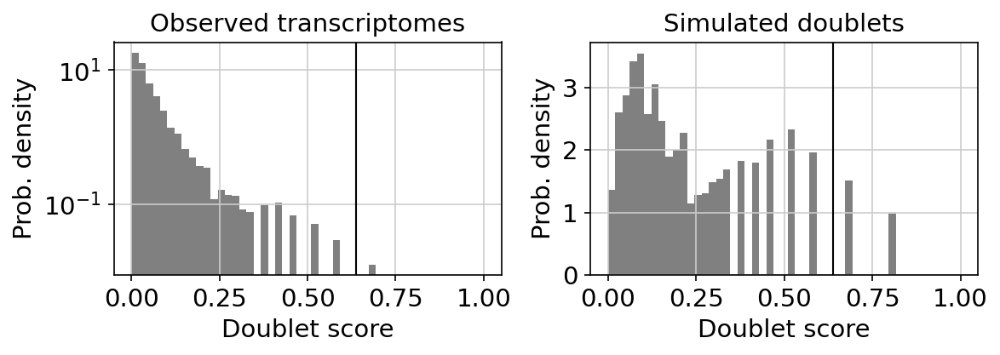

In [44]:
sc.external.pl.scrublet_score_distribution(adata)

In [45]:
adata.obs['predicted_doublet'] = adata.obs['predicted_doublet'].astype(str)

<ipython-input-46-1d4f1b998838>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['predicted_doublet'][doublets] = 'True'
... storing 'predicted_doublet' as categorical


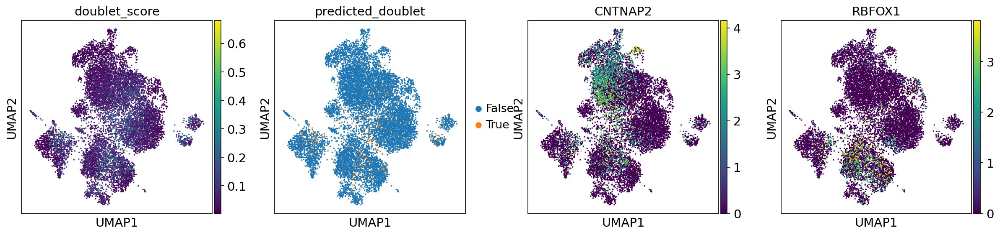

In [46]:
doublets = adata.obs['doublet_score'] > 0.2
adata.obs['predicted_doublet'][doublets] = 'True'
sc.pl.umap(adata, 
          color =['doublet_score','predicted_doublet','CNTNAP2', 'RBFOX1'])

In [47]:
adata.obs['predicted_doublet'].value_counts()

False    11322
True       340
Name: predicted_doublet, dtype: int64

In [48]:
# remove cells predicted to be doublets
adata = adata[adata.obs['predicted_doublet'] == 'False']

In [49]:
adata

View of AnnData object with n_obs × n_vars = 11322 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log_ncounts', 'log_ngenes', 'log_librarysize', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', '_scvi', 'neighbors', 'leiden', 'umap', '10X_run_colors', 'disease_status_colors', 'leiden_colors', 'scrublet', 'predicted_doublet_colors'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

#### Save SCVI-corrected and doublet-removed object

In [50]:
# save SCVI-corrected adata
adata.write(data_directory + sample + "_cellbender_scvi.h5ad")

## Save SCVI-corrected UMAPs

<Figure size 1500x750 with 0 Axes>

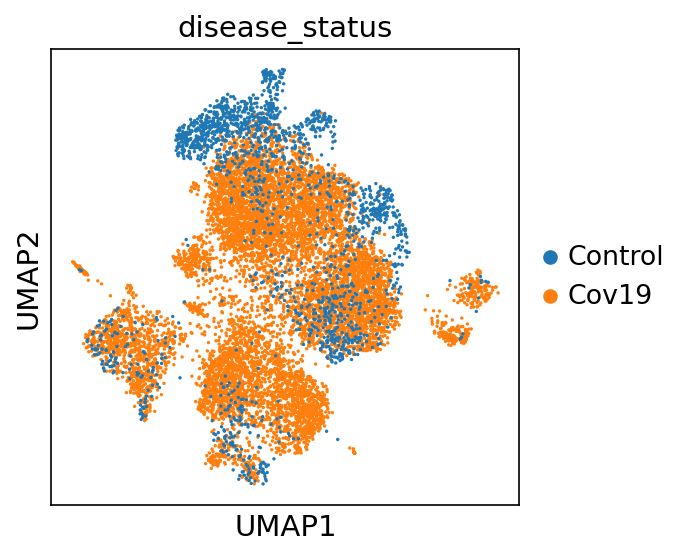

In [51]:
fig = plt.figure(figsize=(10,5))

sc.pl.umap(
    adata,
    color=['disease_status'],
    return_fig =True
)
plt.savefig(figure_directory + sample + '_UMAP-scvi_disease_status.pdf',bbox_inches = 'tight')

<Figure size 1500x750 with 0 Axes>

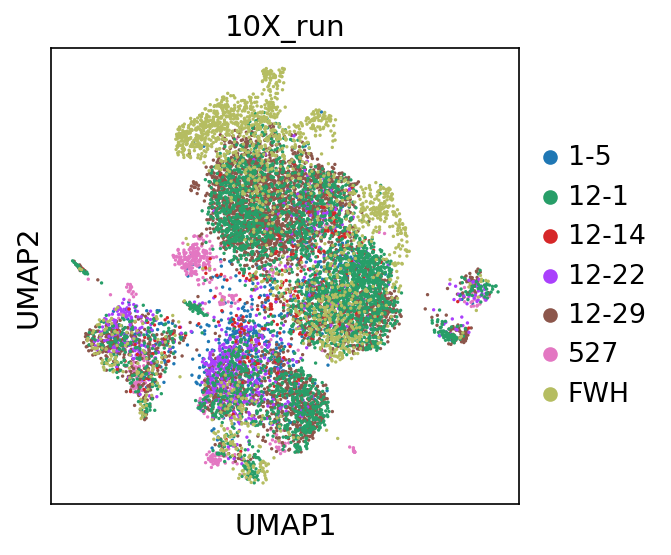

In [52]:
fig = plt.figure(figsize=(10,5))
color_by ='10X_run'
sc.pl.umap(
    adata,
    color=[color_by],
    return_fig =True
)
plt.savefig(figure_directory + sample + '_UMAP-scvi_patient.pdf',bbox_inches = 'tight')

In [53]:
markers = utils.get_markers(sample)

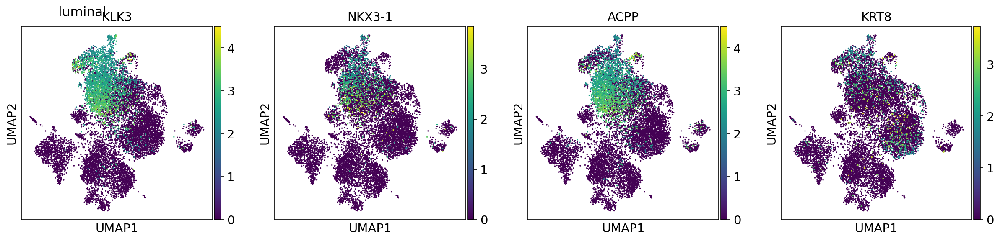

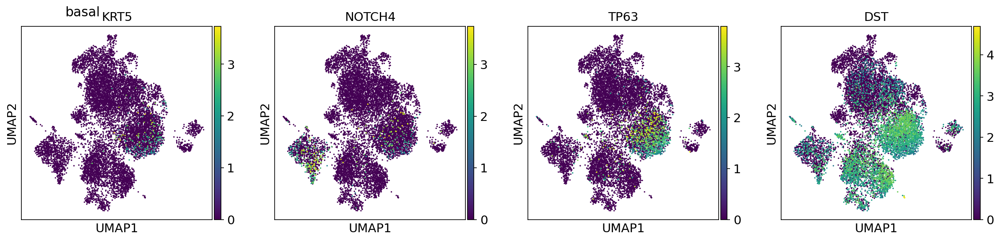

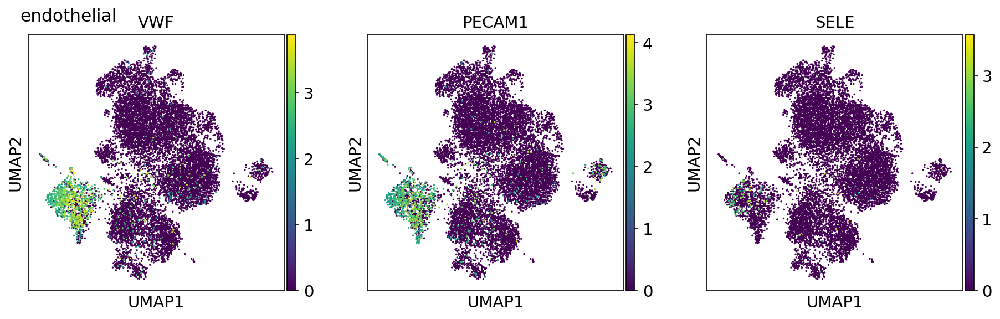

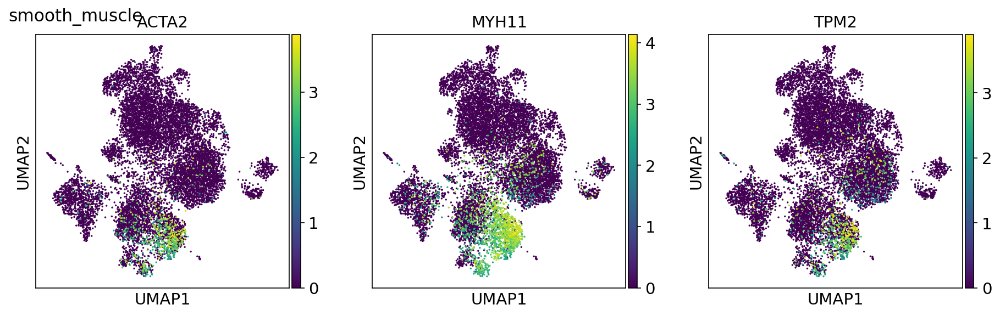

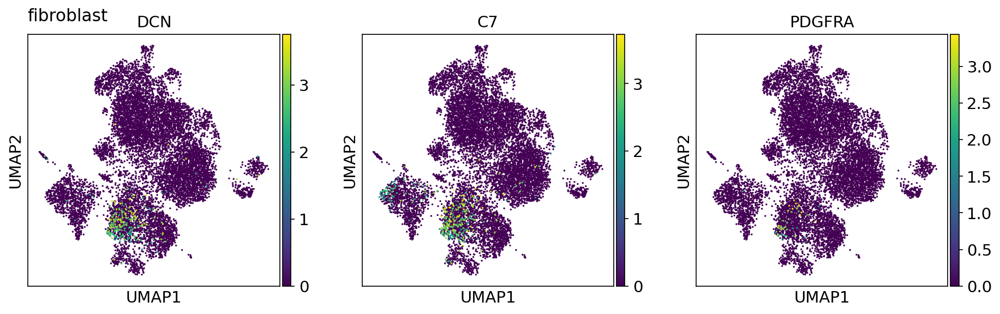

In [54]:
# make umap for each cell type
for cell_type in markers:
    sc.pl.umap(adata,
          color =markers[cell_type], #[cell_type],
          return_fig = True)
    
    plt.suptitle(cell_type, x = 0.1, fontsize=15)
    plt.savefig(figure_directory + sample + '_UMAP-' + cell_type + '.pdf')

Check MT-gene%

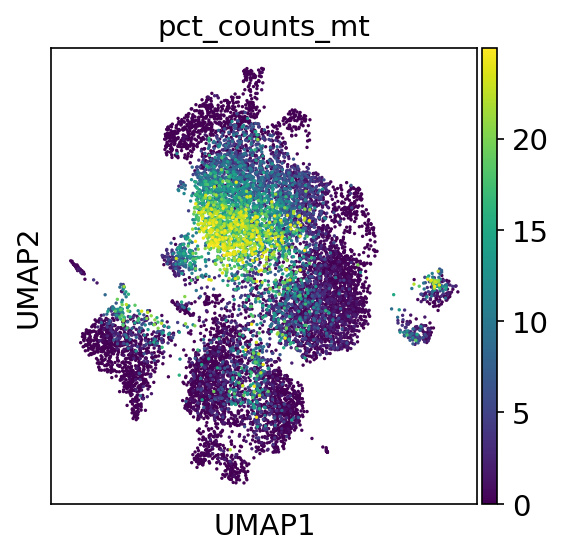

In [55]:
sc.pl.umap(adata, color='pct_counts_mt')

## Transfer preliminary annotations

In [58]:
adata_anot = sc.read_h5ad('/mnt/ibm_lg/achen/covid_tissue_atlas/tissue_optimization/current_objects/prostate_0727.h5ad')

In [59]:
#change obs.names to transfer annotations
adata_anot.obs['Barcode'].head()

Cov19_12-14_prostate_dX-AAACCCAAGAAATCCA-1    AAACCCAAGAAATCCA-1
Cov19_12-14_prostate_dX-AAACCCAAGGATCACG-1    AAACCCAAGGATCACG-1
Cov19_12-14_prostate_dX-AAACCCACAAAGAGTT-1    AAACCCACAAAGAGTT-1
Cov19_12-14_prostate_dX-AAACCCACACGTGAGA-1    AAACCCACACGTGAGA-1
Cov19_12-14_prostate_dX-AAACCCATCATACGGT-1    AAACCCATCATACGGT-1
Name: Barcode, dtype: category
Categories (22375, object): ['AAACCCAAGAAATCCA-1', 'AAACCCAAGACTCGAG-1', 'AAACCCAAGATTGTGA-1', 'AAACCCAAGCACGATG-1', ..., 'TTTGTTGTCGCAGTCG-1', 'TTTGTTGTCGTGCATA-1', 'TTTGTTGTCTGGTGGC-1', 'TTTGTTGTCTTCACGC-1']

In [60]:
adata.obs_names = adata.obs['lab'].astype(str) + adata.obs['Barcode'].astype(str)
adata_anot.obs_names = adata_anot.obs['lab'].astype(str) + adata_anot.obs['Barcode'].astype(str)

In [61]:
# tranfer annotations
adata.obs['annotations_v1'] = adata_anot.obs['annotations_v1']

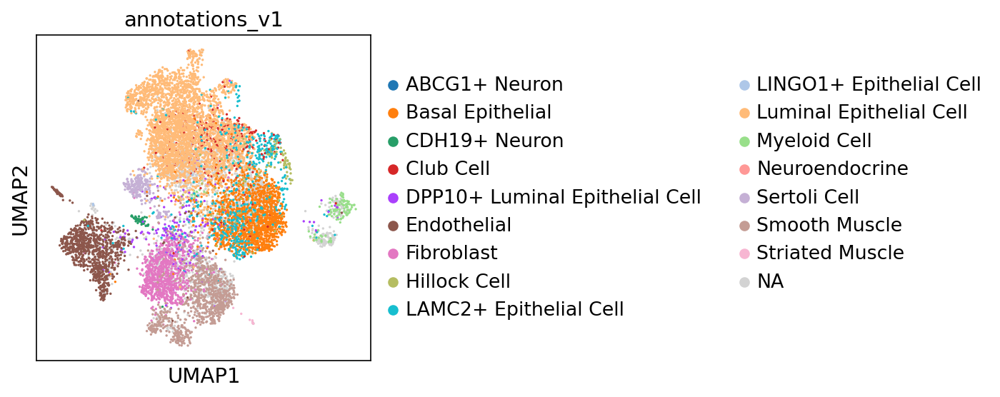

In [64]:
sc.pl.umap(adata, color='annotations_v1')

## Rank genes (leiden clustering)

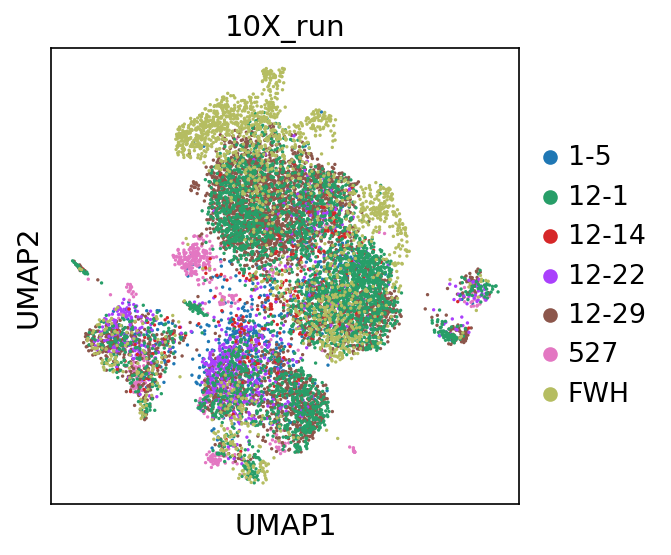

In [67]:
sc.pl.umap(adata, color='10X_run')

In [68]:
adata

AnnData object with n_obs × n_vars = 11322 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log_ncounts', 'log_ngenes', 'log_librarysize', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden', 'doublet_score', 'predicted_doublet', 'annotations_v1'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', '_scvi', 'neighbors', 'leiden', 'umap', '10X_run_colors', 'disease_status_colors', 'leiden_colors', 'scrublet', 'predicted_doublet_colors', 'annotations_v1_colors'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

<Figure size 1500x750 with 0 Axes>

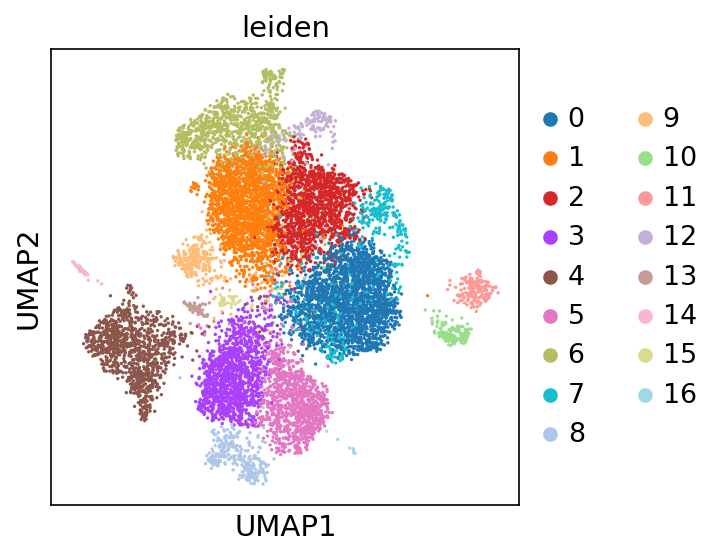

In [69]:
fig = plt.figure(figsize=(10,5))
color_by ='leiden'
sc.pl.umap(
    adata,
    color=[color_by],
    return_fig =True
)
plt.savefig(figure_directory + sample + '_UMAP-scvi_leiden.pdf',bbox_inches = 'tight')

In [70]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden', method = 'wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:28)


In [71]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(25)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,DST,MT-ND5,MTRNR2L12,MIR99AHG,LDB2,MYH11,CPNE4,ANXA2,PRKG1,ERBB4,PARP8,FYB1,BAIAP2,CADM2,TFPI,ANKRD7,TTN
1,CPA6,MTRNR2L12,DHFR,FBLN1,FLT1,CALD1,CUX2,CDH1,EPS8,CTNNA2,SKAP1,AOAH,IQCN,NRXN1,MMRN1,ANKRD30A,CMYA5
2,PCDH7,MT-CO1,SLC4A4,LAMA2,VWF,CARMN,PTPRN2,LINC00511,DLC1,GPC5,AC105402.3,TBXAS1,PMEPA1,NRXN3,SEMA3A,FMN1,RYR2
3,SYNE2,MT-CYB,AC105402.3,SLIT2,ANO2,SORBS1,PHF21B,EZR,NR2F2-AS1,AC016205.1,PTPRC,PLXDC2,LMNA,ADGRB3,PKHD1L1,IQCH,DST
4,THSD4,MT-ND1,ARHGEF38,SYNE1,PECAM1,DMD,SHANK2,LMNA,SOX5,ATF7IP2,HSP90AA1,SLC8A1,CASZ1,XKR4,ST6GALNAC3,LINC01206,ABLIM1
5,EYA2,DHFR,MT-CO1,KAZN,ST6GALNAC3,PRUNE2,KLK3,ITPKC,CACNA1C,MT-CO1,MALAT1,CELF2,SQSTM1,PPP2R2B,PPFIBP1,ANKRD62,MYH7
6,EGFR,MT-ATP6,LIMCH1,GPC6,TCF4,ACTG2,KLK2,LAMC2,SLIT3,MT-CO3,MBNL1,DOCK2,NR4A1,SORCS1,GPM6A,SPAG16,TRDN-AS1
7,KANK1,MT-ND4L,ST6GAL1,LSAMP,PKP4,SYNM,CACNA1D,SEPT9,RCAN2,NCAM2,CELF2,LRMDA,PLEKHG2,EHBP1,CD36,LINC01606,FILIP1
8,MECOM,MT-ND2,MT-CYB,RORA,DOCK4,LMOD1,PMEPA1,SEMA4A,EBF1,MT-ND1,CD96,FMN1,SEMA4A,STARD13,RELN,LEKR1,NCAM1
9,AC013652.1,MTRNR2L8,PDE4D,PCDH9,ZNF385D,PDZRN4,AL117329.1,GPRC5A,CALD1,DPP6,FYN,DPYD,KDM4B,DST,KALRN,CFAP299,NEXN


In [72]:
louvain_degs = pd.DataFrame(adata.uns['rank_genes_groups']['names'])
louvain_degs.to_csv(figure_directory + sample + '-leiden-degs.csv')

## Visualize object summary (dotplots)

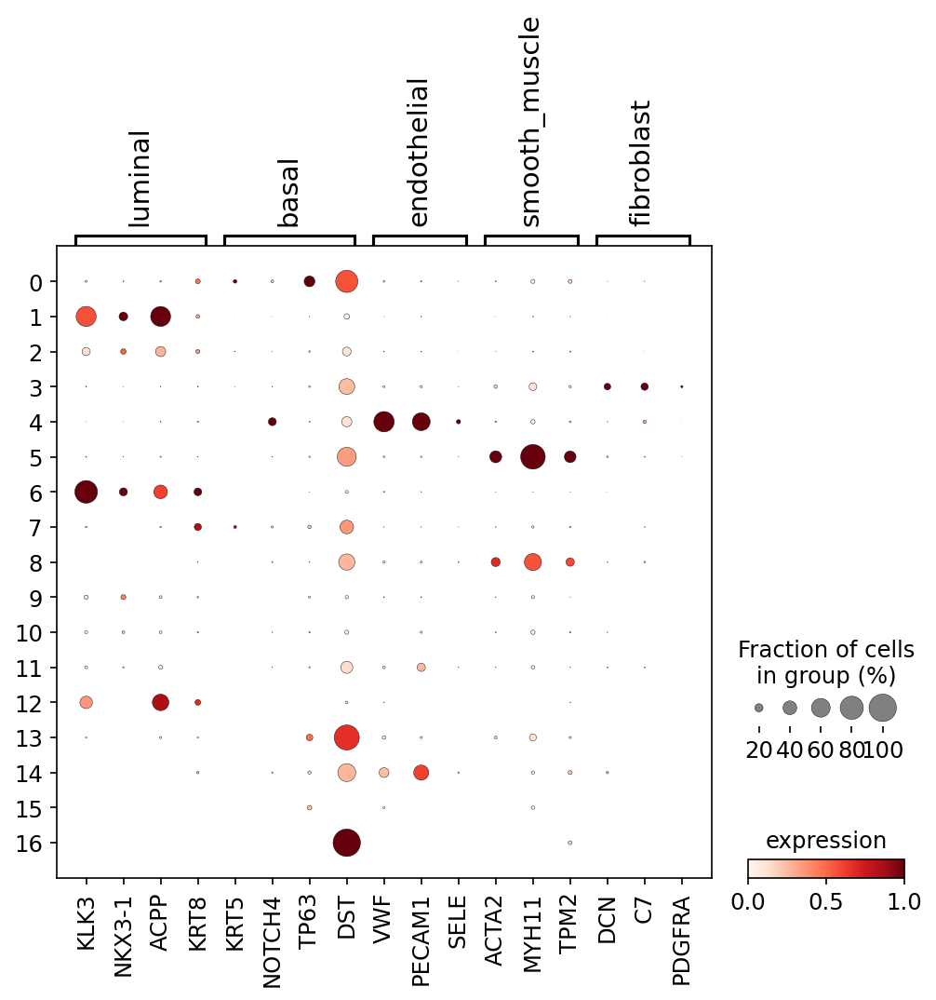

In [73]:
sc.pl.dotplot(adata, 
              var_names=markers, 
              layer='counts',
              groupby='leiden',
              log=True,
              standard_scale='var',
              colorbar_title = 'expression',
              save= sample + '_cell_type.pdf')

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:18)
Storing dendrogram info using `.uns['dendrogram_leiden']`


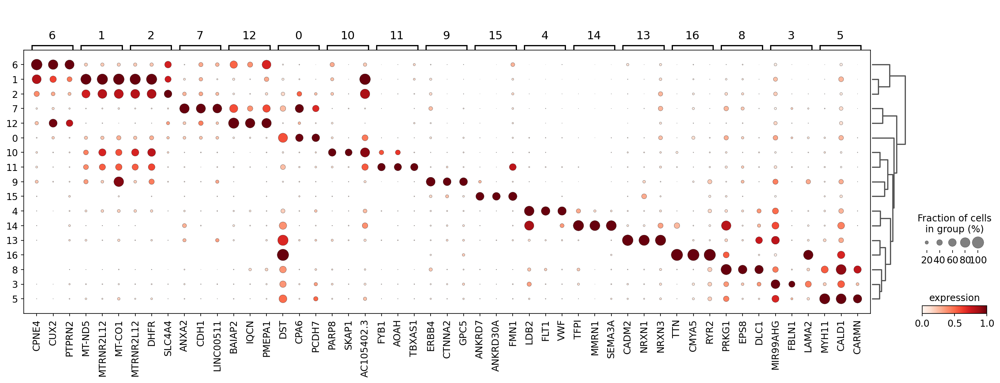

In [74]:
sc.pl.rank_genes_groups_dotplot(adata,
                                n_genes=3,
                                standard_scale='var',
                                colorbar_title='expression', 
                                save= sample + '_top_cluster_degs.pdf')

### Save final object

In [75]:
# save SCVI-corrected adata
adata.write(data_directory + sample + "_cellbender_scvi.h5ad")

In [76]:
adata = sc.read_h5ad(data_directory + sample + "_cellbender_scvi.h5ad")

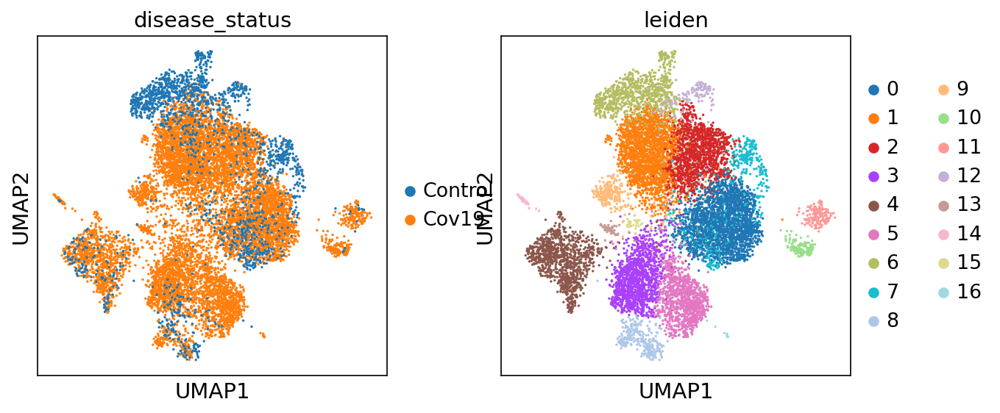

In [77]:
sc.pl.umap(adata, color=['disease_status', 'leiden'])

In [78]:
adata

AnnData object with n_obs × n_vars = 11322 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log_ncounts', 'log_ngenes', 'log_librarysize', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden', 'doublet_score', 'predicted_doublet', 'annotations_v1'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: '10X_run_colors', '_scvi', 'annotations_v1_colors', 'dendrogram_leiden', 'disease_status_colors', 'leiden', 'leiden_colors', 'neighbors', 'predicted_doublet_colors', 'rank_genes_groups', 'scrublet', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'